In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as mpl
import matplotlib.patches as mpa
import astropy.wcs as pywcs
from astropy.io import fits as pyfits
import scipy.ndimage as snd


from astropy.utils.data import get_pkg_data_filename
#import subprocess as sp
#from astropy.table import Table, hstack, join, Column
#import sys
#import os

from astropy.io import ascii
#import urllib


# from astropy.utils.data import get_pkg_data_filename
# import subprocess as sp
import glob
# from astropy.table import Table, hstack, join
# import sys
# import os
# from astropy.io import ascii
# from astropy.table import Column

In [2]:
#Bruno's code to get outlines of fields
# coding: utf-8

def create_footprint(data,header, debug=False):
    imgMask = np.zeros_like(data)
    smoothData = snd.gaussian_filter(data,sigma=2) # to smooth over artifacts
    imgMask[smoothData!=0] = 1 # mask non-zero pixels
    if debug is True:
        fig,ax = mpl.subplots(figsize=(18,16))
        ax.imshow(smoothData,vmin=0,vmax=0.5)
        cntr = ax.contour(imgMask,levels=[0.5],zorder=10,colors="white")
    else:
        cntr = mpl.contour(imgMask,levels=[0.5]) # contour separating 0 and 1 pixels
        mpl.close("all")
    dataSegments = cntr.allsegs
    
    sky_coords_all = []
    
    for i in range(len(dataSegments[0])):
        polygon = dataSegments[0][i] # get contour pixel coordinates
        wcs = pywcs.WCS(header)
        sky_coords = wcs.all_pix2world(polygon,1) # transform pixel to sky coordinates
        sky_coords_all.append(sky_coords)
    return sky_coords_all


In [3]:
#if needed
#masterdata = ascii.read('/run/media/rowland/PURPLEDRIVE/mastertable')
#masterdata

# Footprints

/data1/rowland/all_fits_data/hst_14096_i2_wfc3_ir_f160w_drz.fits
<class 'list'> (1, 8331, 2) [array([[ 15.71091727, -49.27446724],
       [ 15.71087895, -49.27446724],
       [ 15.71084064, -49.27446724],
       ...,
       [ 15.71093644, -49.27442974],
       [ 15.71093643, -49.27445474],
       [ 15.71091727, -49.27446724]])]


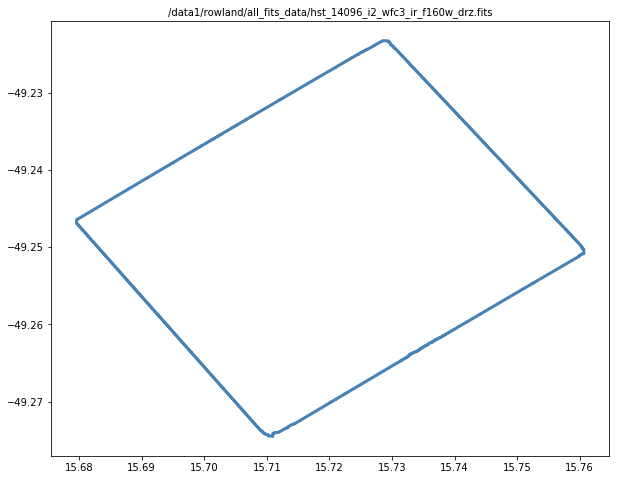

In [3]:
#input data

all_filter_files = glob.glob('/data1/rowland/all_fits_data/hst*_f*.fits') 

FIG, AX = mpl.subplots()

for image in all_filter_files:
    print(image)

    imgname = image #"ElGordoTest_F160W.fits" # name of image to get footprint
    img = pyfits.open(imgname)
    imgHeader = img['SCI'].header
    imgData = img['SCI'].data
    #imgHeader = pyfits.getheader(imgname)
    #imgData = pyfits.getdata(imgname)
    #print(imgname, imgHeader, imgData) #its picking the first index [sci,wht,ctx,exp]
    sky_coords = create_footprint(imgData,imgHeader,debug = False)
    img.close()
    print(type(sky_coords),np.shape(sky_coords),sky_coords)
    fig,ax = mpl.subplots(figsize=(10,8))
    for i in range(len(sky_coords)):
        ax.plot(sky_coords[i][:,0],sky_coords[i][:,1],"-",color="SteelBlue",lw=3)
        ax.set_title(imgname,fontsize=10)
        AX.plot(sky_coords[i][:,0],sky_coords[i][:,1],"-")
    break

# Subtracted Elgordos

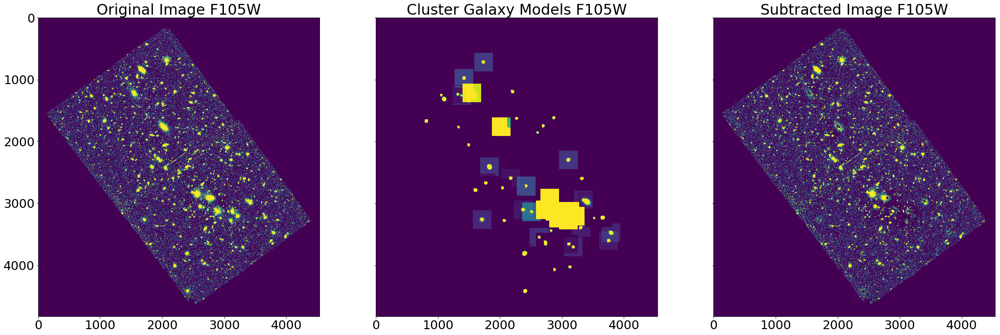

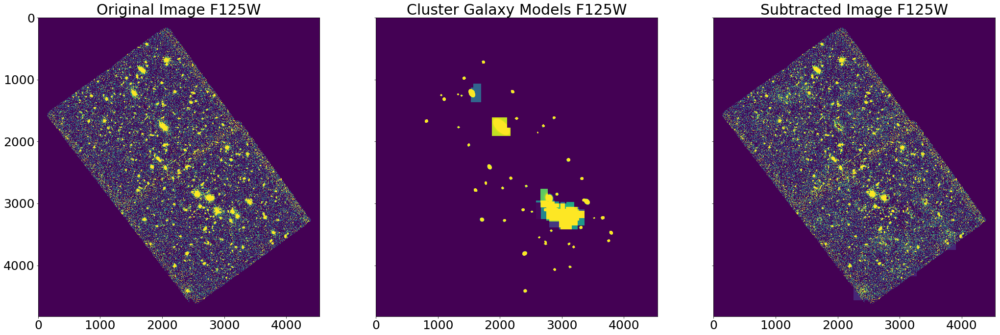

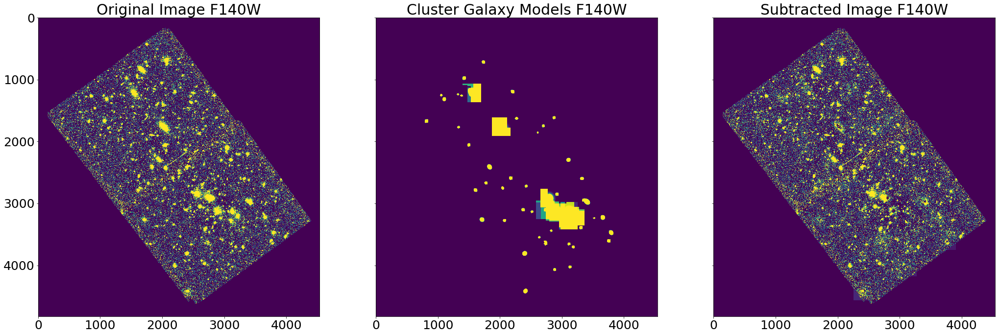

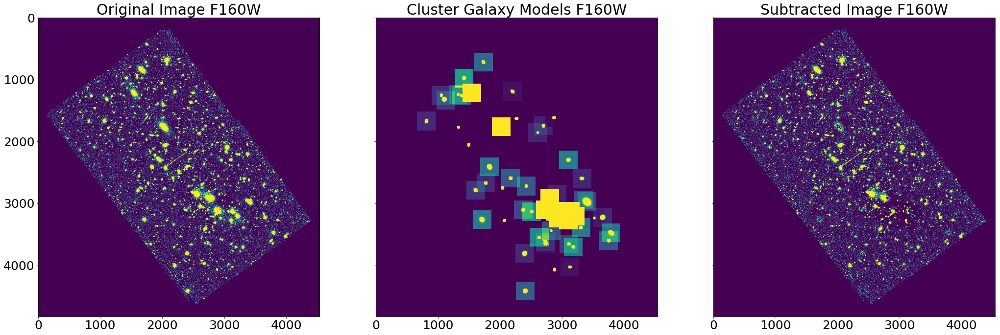

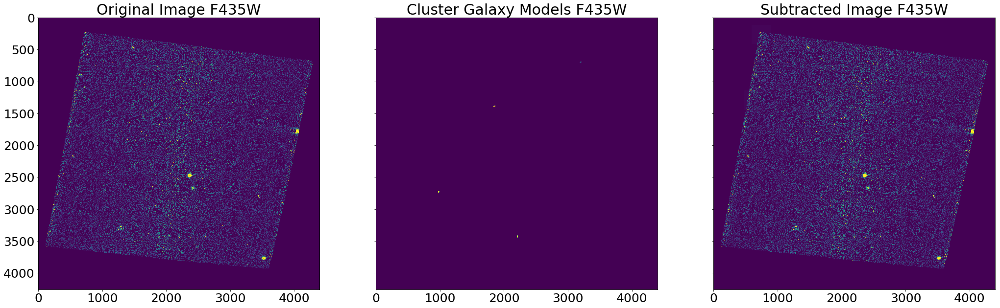

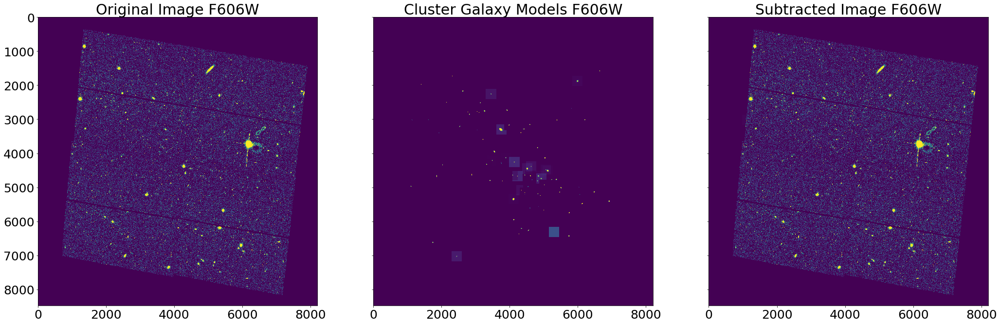

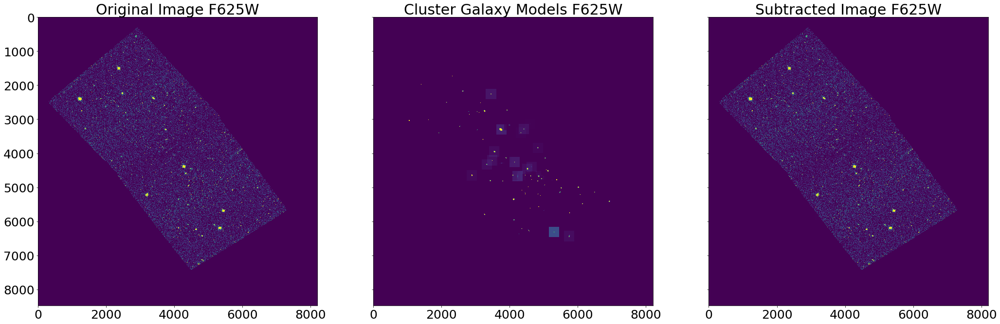

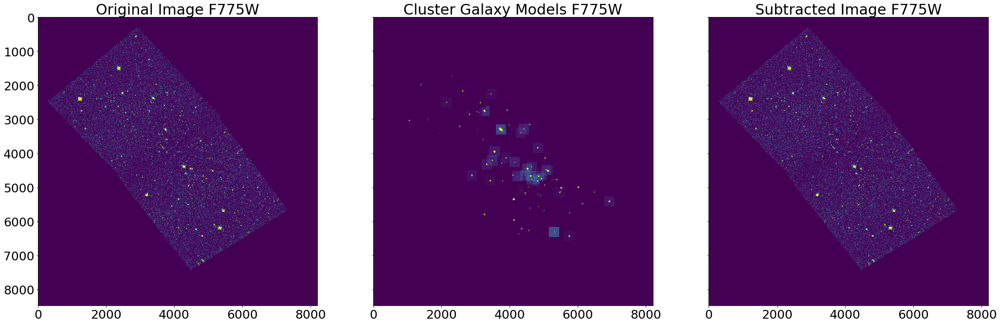

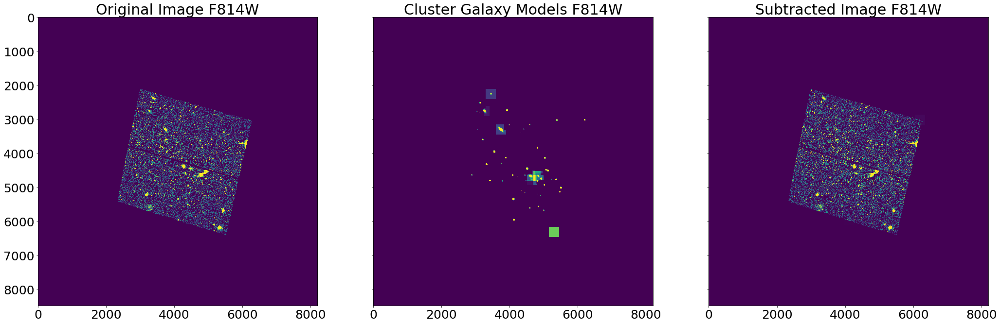

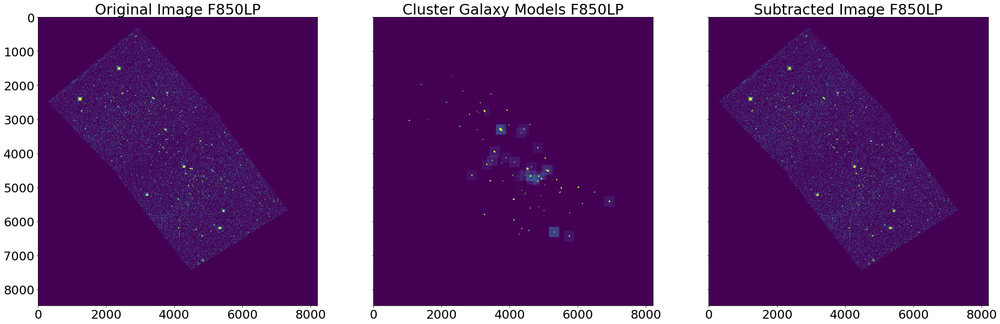

In [2]:
#to plot one at a time and tweek vmin/vmax

filters = ['F105W','F125W','F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP'] #['F435W'] #


for filter in filters:
    originalimage = pyfits.getdata('/data1/rowland/elgordo_{}.fits'.format(filter))
    emptyfield = pyfits.getdata('/data1/rowland/models_elgordo{}'.format(filter))#.data
    backgrounds = pyfits.getdata('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))#.data
    mpl.rcParams.update({'font.size': 25})
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(originalimage,vmin=0,vmax=0.02) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter),)
    ax2.imshow(emptyfield,vmin=0,vmax=0.002)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models {}'.format(filter))
    ax3.imshow(backgrounds,vmin=0,vmax=0.02)#residuals
    ax3.title.set_text('Subtracted Image {}'.format(filter))
    mpl.savefig('/data1/rowland/Figures/threefigs_{}'.format(filter),overwrite=True)
    #f.savefig('/data1/rowland/Figures/threefigs_ALLfilters',overwrite=True)

In [20]:
#takes soo long to run...just do indiviually above, its way faster

#doing first half of filters so runs faster


# filters = ['F105W','F125W','F140W','F160W','F435W'] #,'F606W','F625W','F775W','F814W','F850LP']

# for filter in filters:
#     originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
#     original_image_data = pyfits.getdata(originalimage)
#     emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
#     emptyfields = pyfits.getdata(emptyfield)
#     backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
#     background = pyfits.getdata(backgrounds)
#     f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
#     ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
#     ax1.title.set_text('Original Image')
#     ax2.imshow(emptyfields,vmin=0,vmax=0.2)#subtracted galaxies
#     ax2.title.set_text('Cluster Galaxy Models')
#     ax3.imshow(background,vmin=0,vmax=0.2)#residuals
#     ax3.title.set_text('Subtracted Image')

# INDIVIDUAL plots per filter

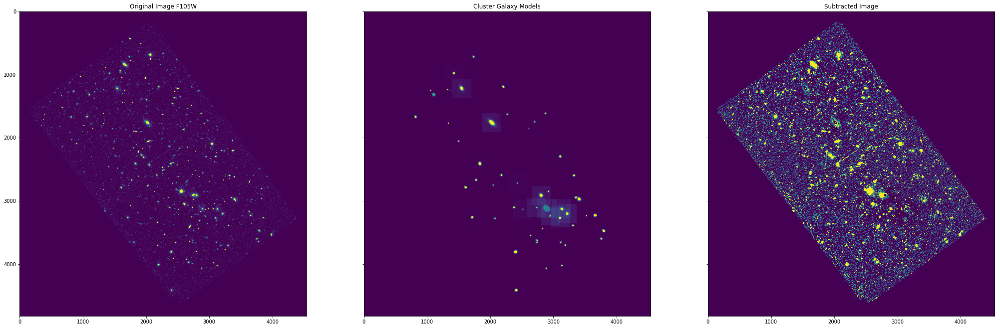

In [12]:


filters = ['F105W']#,'F125W','F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP']


for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.05)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

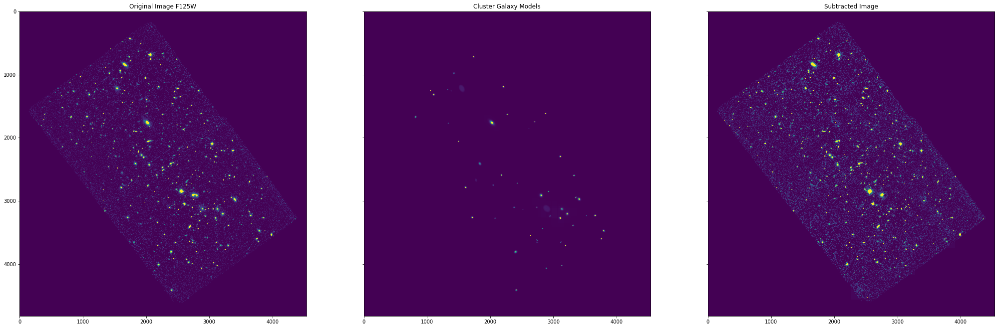

In [15]:
filters = ['F125W']#,'F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=0.12)#residuals
    ax3.title.set_text('Subtracted Image')

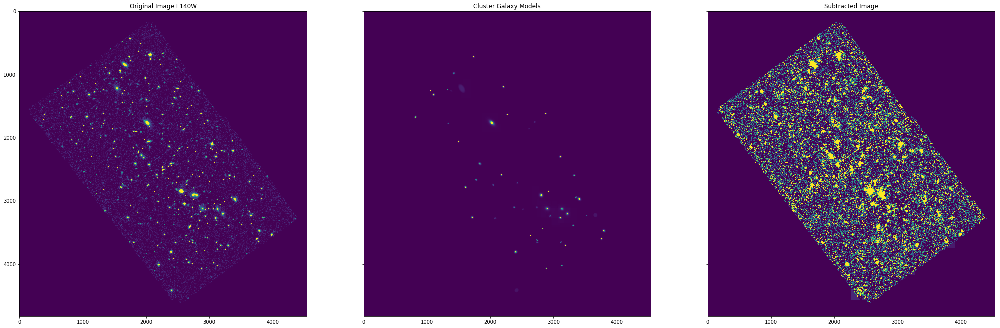

In [17]:
filters = ['F140W']#,'F160W','F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

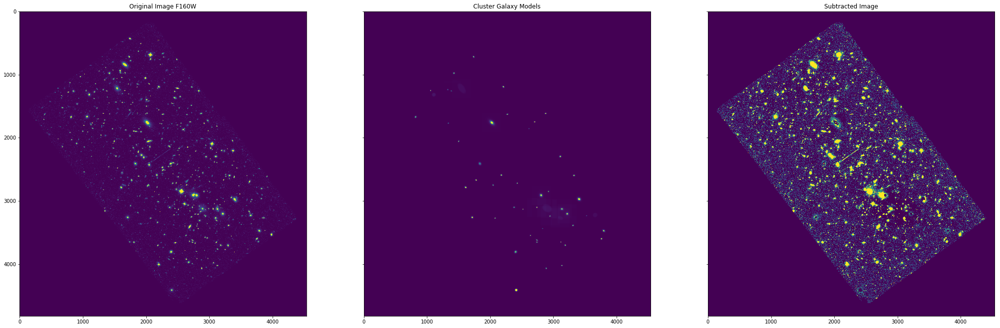

In [18]:
filters = ['F160W']#,'F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

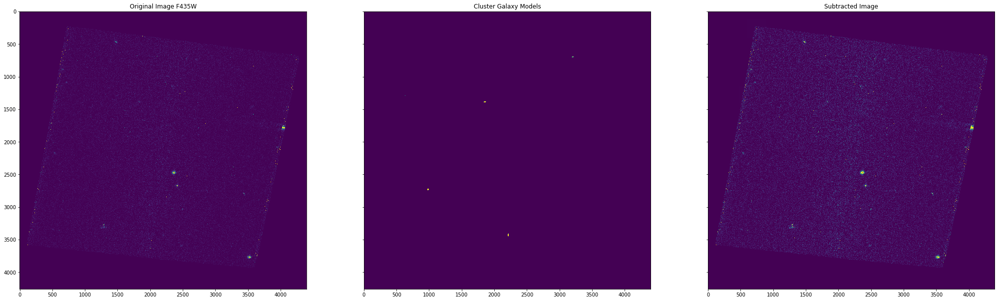

In [21]:
filters = ['F435W']#,'F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.1) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.001)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.05)#residuals
    ax3.title.set_text('Subtracted Image')

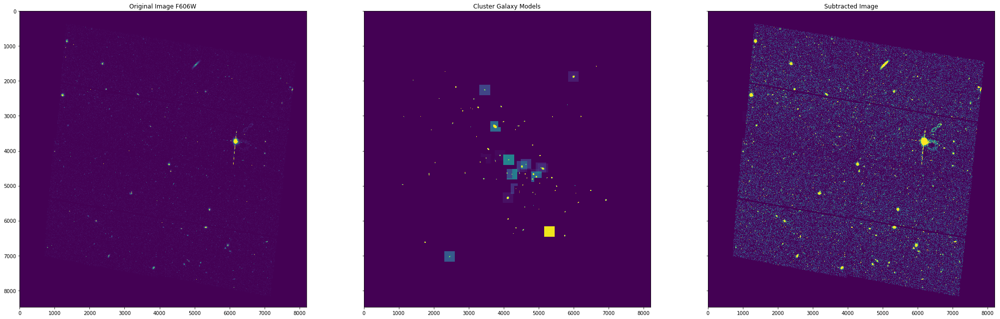

In [25]:
filters = ['F606W']#,'F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.0005)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

AttributeError: 'str' object has no attribute 'close'

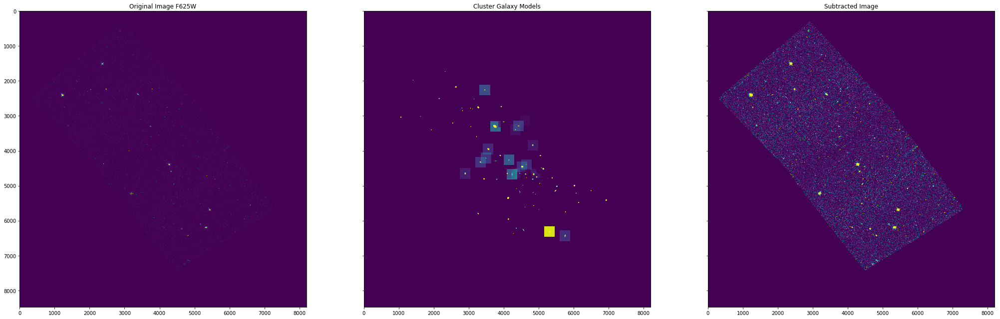

In [31]:
filters = ['F625W']#,'F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.0005)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=0.02)#residuals
    ax3.title.set_text('Subtracted Image')
    

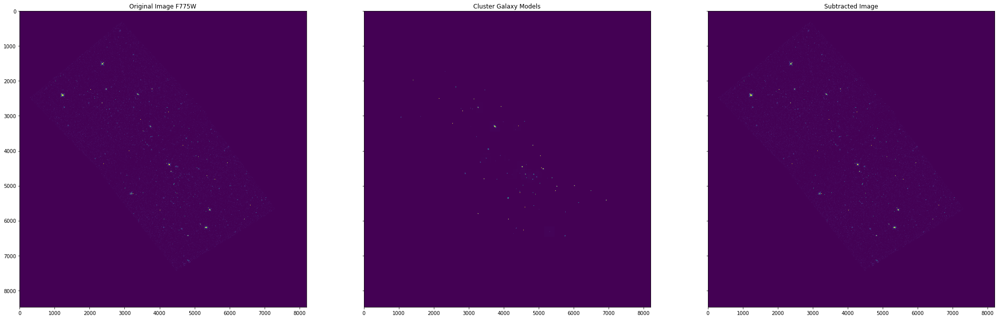

In [29]:
filters = ['F775W']#,'F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.0002)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

In [ ]:
filters = ['F814W']#,'F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.05)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.2)#residuals
    ax3.title.set_text('Subtracted Image')